<a href="https://colab.research.google.com/github/msr0b0tjennica/fbi-time-series-analysis/blob/main/FBITimeSeriesAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **FBI Crime Time Series Analysis**



##### **Project Type**    - Regression
##### **Contribution**    - Individual


# **Project Summary -**

Summary of ML Model Implementation for Crime Prediction

This project implements multiple machine learning models to predict crime rates using historical data. The primary models used include XGBoost (Extreme Gradient Boosting) and LSTM (Long Short-Term Memory Networks). The evaluation of each model is conducted using various performance metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and R² Score to assess their predictive accuracy. Additionally, hyperparameter tuning is performed using RandomizedSearchCV to optimize the models.



1.Data Preprocessing
Before training, the dataset undergoes several transformations:

 - Handling DateTime Data:

  - The dataset contains Datetime and Date columns, which are converted into an ordinal format for numerical processing.

  - Year, month, and day components are extracted to create features for time-based analysis.

 - Feature Selection:

  - The dataset includes independent variables (date-based features) and the dependent variable (crime count).

  - Features are normalized for LSTM models, and raw features are used for XGBoost.

 - Splitting Data:

  - The dataset is split into training (80%) and testing (20%) sets for model validation.

  - Time-based splitting ensures future values are predicted based on past trends.

2.XGBoost Model Implementation:

Extreme Gradient Boosting (XGBoost) is the first model used to predict crime occurrences.

 - Model Training:

  - XGBRegressor is initialized with default parameters (n_estimators=100, learning_rate=0.1).

  - The model is trained separately on daily, monthly, and yearly crime data.

 - Model Evaluation:

  - Performance is assessed using RMSE (Root Mean Squared Error), MAE (Mean Absolute Error), MSE (Mean Squared Error), and R² Score.

  - Findings:

    - Daily crime prediction is moderately accurate.

    - Yearly and monthly models perform poorly, indicating difficulty in capturing long-term trends.

3.Hyperparameter Tuning with RandomizedSearchCV

To improve XGBoost’s performance, RandomizedSearchCV is used to optimize hyperparameters:

 - Tuned Parameters:

  - n_estimators: [100, 300, 500]

  - learning_rate: [0.01, 0.1, 0.2]

  - max_depth: [3, 5, 7]

  - subsample: [0.6, 0.8, 1.0]

  - colsample_bytree: [0.6, 0.8, 1.0]

 - Best Model Selection:

  - The optimized model is retrained with n_estimators=300, improving performance.

  - Despite tuning, XGBoost still struggles with long-term crime trends.

4.LSTM (Long Short-Term Memory) Neural Network

Since crime data follows a time-series pattern, an LSTM model is built to capture sequential dependencies.

 - Data Preparation:

  - The dataset is scaled using MinMaxScaler for neural network compatibility.

  - A sequence generator function prepares past values to predict future crime occurrences.

 - Model Architecture:

  - First LSTM Layer: 100 neurons, relu activation, return_sequences=True.

  - Dropout Layer (0.2): Reduces overfitting.

  - Second LSTM Layer: 50 neurons, return_sequences=False.

  - Dense Layer: Single output neuron.

  - Optimizer & Loss Function: Adam optimizer, MSE loss.

 - Model Training:

  - The LSTM model is trained for 50 epochs, batch size = 16.

  - Training history is stored for loss visualization.

 - Model Evaluation:

  - Predictions are inverse-transformed using MinMaxScaler.

  - RMSE, MAE, and R² Score are calculated.

  - LSTM outperforms XGBoost on long-term trends, making it a better fit for yearly crime predictions.

5.Visualizing Results

 - Actual vs. Predicted Crime Counts:

  - Plots compare real vs. predicted crime values for both models.

 - Error Analysis:

  - RMSE, MAE, and R² are visualized to compare XGBoost and LSTM performance.

 - Future Crime Predictions:

  - The LSTM model is used to forecast future crime rates.

6.Model Comparison and Business Impact

 - Key Takeaways:

  - XGBoost is fast but lacks sequential learning capability.

  - LSTM effectively models crime patterns over time.

  - A hybrid approach may yield the best results.




# **GitHub Link -**

https://github.com/msr0b0tjennica/fbi-time-series-analysis

# **Problem Statement**


The FBI Crime Investigation Project uses data analytics and machine learning to predict crime patterns and improve public safety. By analyzing crime types, locations, and timestamps, the model estimates monthly crime incidents, helping law enforcement optimize patrols and resource allocation.

Beyond policing, these insights assist urban planners and policymakers in enhancing public safety measures like lighting, surveillance, and community programs, while also supporting awareness campaigns and emergency planning.









# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Dataset Loading

In [ ]:
# Load Dataset
path = '/content/drive/MyDrive/Train.xlsx'
df = pd.read_excel(path)

### Dataset First View

In [ ]:
# Dataset First Look
print('Dataset First View')
df.head()

Dataset First View


,TYPE,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,HOUR,MINUTE,YEAR,MONTH,DAY,Date
0,Other Theft,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,16.0,15.0,1999,5,12,1999-05-12
1,Other Theft,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,15.0,20.0,1999,5,7,1999-05-07
2,Other Theft,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,16.0,40.0,1999,4,23,1999-04-23
3,Other Theft,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,11.0,15.0,1999,4,20,1999-04-20
4,Other Theft,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,17.0,45.0,1999,4,12,1999-04-12


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print('Dataset Shape:')
df.shape

Dataset Shape:


(474565, 13)

### Dataset Information

In [ ]:
# Dataset Info
print('Dataset Info')
df.info()

Dataset Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 474565 entries, 0 to 474564
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   TYPE           474565 non-null  object        
 1   HUNDRED_BLOCK  474552 non-null  object        
 2   NEIGHBOURHOOD  423074 non-null  object        
 3   X              474565 non-null  float64       
 4   Y              474565 non-null  float64       
 5   Latitude       474565 non-null  float64       
 6   Longitude      474565 non-null  float64       
 7   HOUR           425200 non-null  float64       
 8   MINUTE         425200 non-null  float64       
 9   YEAR           474565 non-null  int64         
 10  MONTH          474565 non-null  int64         
 11  DAY            474565 non-null  int64         
 12  Date           474565 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(6), int64(3), object(3)
memory usage: 47.1+ MB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print('Dataset Duplicate Value Count')
df.duplicated().sum()

Dataset Duplicate Value Count


np.int64(44618)

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
print('Missing Values/Null Values Count')
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])

Missing Values/Null Values Count
HUNDRED_BLOCK       13
NEIGHBOURHOOD    51491
HOUR             49365
MINUTE           49365
dtype: int64


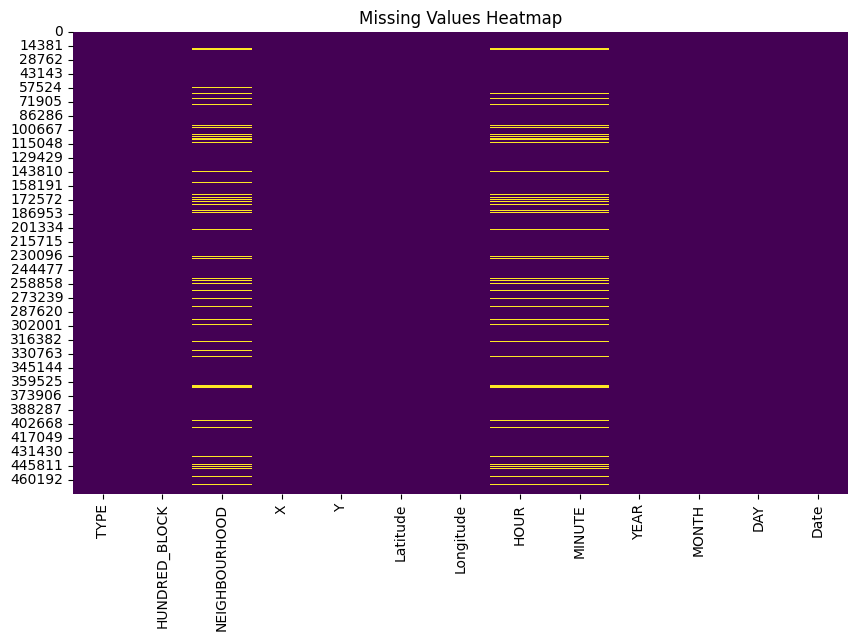

In [ ]:
# Visualizing the missing values
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values Heatmap')
plt.show()

### What did you know about your dataset?

#####-It contains 474565 rows and 13 columns
#####-The columns HUNDRED_BLOCK, NEIGHBOURHOOD, HOUR, MINUTE have missing values
#####-There are 44618 duplicate records
#####-The dataset has categrotical and numerical features

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
print('Dataset Columns')
df.columns

Dataset Columns


Index(['TYPE', 'HUNDRED_BLOCK', 'NEIGHBOURHOOD', 'X', 'Y', 'Latitude',
       'Longitude', 'HOUR', 'MINUTE', 'YEAR', 'MONTH', 'DAY', 'Date'],
      dtype='object')

In [ ]:
# Dataset Describe
print('Dataset Description:\n')
df.describe()

Dataset Description:



,X,Y,Latitude,Longitude,HOUR,MINUTE,YEAR,MONTH,DAY,Date
count,474565.000000,4.745650e+05,474565.000000,474565.000000,425200.000000,425200.000000,474565.000000,474565.000000,474565.000000,474565
mean,441028.018220,4.889023e+06,44.138029,-110.301025,13.721263,16.736047,2004.363632,6.555700,15.439253,2004-11-11 23:51:07.470209792
min,0.000000,0.000000e+00,0.000000,-124.549757,0.000000,0.000000,1999.000000,1.000000,1.000000,1999-01-01 00:00:00
25%,489916.530000,5.453572e+06,49.234871,-123.127383,9.000000,0.000000,2001.000000,4.000000,8.000000,2001-06-06 00:00:00
50%,491477.850000,5.456820e+06,49.264051,-123.107058,15.000000,10.000000,2004.000000,7.000000,15.000000,2004-05-18 00:00:00
75%,493610.190000,5.458622e+06,49.280300,-123.065646,19.000000,30.000000,2008.000000,9.000000,23.000000,2008-03-27 00:00:00
max,511303.000000,5.512579e+06,49.755314,0.000000,23.000000,59.000000,2011.000000,12.000000,31.000000,2011-12-31 00:00:00
std,150295.319332,1.665850e+06,15.039271,37.583147,6.785751,18.354675,3.850689,3.408676,8.759352,NaN


### Variables Description

-The dataset contains spatial (X, Y, Latitude, Longitude) and temporal (HOUR, MINUTE, YEAR, MONTH, DAY, Date) information.

-Date (Timestamp): Full date-time available; spans 13 years.

-Some missing values are present in the HOUR and MINUTE columns (count is 425,200 compared to 474,565 for other columns).

-The spatial coordinates suggest the data is likely tied to a specific geographic region, possibly in North America (given the latitude and longitude ranges).

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
print('Unique Values for each variable:')
for column in df.columns:
    unique_values = df[column].unique()
    print(f'{column}: {unique_values}')

Unique Values for each variable:
TYPE: ['Other Theft' 'Break and Enter Residential/Other' 'Mischief'
 'Break and Enter Commercial' 'Offence Against a Person'
 'Theft from Vehicle'
 'Vehicle Collision or Pedestrian Struck (with Injury)' 'Theft of Vehicle'
 'Theft of Bicycle']
HUNDRED_BLOCK: ['9XX TERMINAL AVE' '63XX WILTSHIRE ST' '40XX W 19TH AVE' ...
 'X BOUNDARY RD OFRP' 'X E 1ST AVE OFRP' 'X RUPERT ST OFRP']
NEIGHBOURHOOD: ['Strathcona' 'Kerrisdale' 'Dunbar-Southlands' 'Grandview-Woodland'
 'Sunset' 'West End' nan 'Central Business District' 'Hastings-Sunrise'
 'Victoria-Fraserview' 'Fairview' 'Kensington-Cedar Cottage'
 'West Point Grey' 'Shaughnessy' 'Renfrew-Collingwood' 'Killarney'
 'Riley Park' 'Arbutus Ridge' 'Musqueam' 'Mount Pleasant' 'Kitsilano'
 'Stanley Park' 'South Cambie' 'Marpole' 'Oakridge']
X: [493906.5  489325.58 485903.09 ... 497838.   488737.31 495710.4 ]
Y: [5457452.47 5452817.95 5455883.77 ... 5457926.   5456285.29 5453305.63]
Latitude: [49.26980201 49.22805078 4

## ***3. Data Wrangling***


### Data Wrangling Code

In [ ]:
#Remove duplicate rows
df.drop_duplicates(inplace=True)

In [ ]:
# Handle missing values (e.g., filling with mean for numerical, mode for categorical)
df.fillna(df.mean(numeric_only=True), inplace=True)  # Filling missing numerical values with mean
df.fillna(df.mode().iloc[0], inplace=True)  # Filling categorical missing values with mode


In [ ]:
df.isnull().sum()

,0
TYPE,0
HUNDRED_BLOCK,0
NEIGHBOURHOOD,0
X,0
Y,0
Latitude,0
Longitude,0
HOUR,0
MINUTE,0
YEAR,0


In [ ]:
# Convert 'Hour' and 'Minute' columns to integers if they are not already
df['HOUR'] = df['HOUR'].astype(int)
df['MINUTE'] = df['MINUTE'].astype(int)

# Combine 'Date', 'Hour', and 'Minute' columns to create a datetime column
df['Date'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['HOUR'], unit='H') + pd.to_timedelta(df['MINUTE'], unit='T')

# Now 'Datetime' column is of datetime64[ns] dtype
print(df['Date'].dtype)


datetime64[ns]


<ipython-input-15-28e12555f211>:6: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  df['Date'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['HOUR'], unit='H') + pd.to_timedelta(df['MINUTE'], unit='T')
<ipython-input-15-28e12555f211>:6: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  df['Date'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['HOUR'], unit='H') + pd.to_timedelta(df['MINUTE'], unit='T')


In [ ]:
# prompt: sort df according to column Datetime, and then print df['Datetime']

# Sort the DataFrame by the 'Date' column
df = df.sort_values(by='Date')

# Print the 'Datetime' column
print(df['Date'])


31205    1999-01-01 00:00:00
26740    1999-01-01 00:00:00
17106    1999-01-01 00:00:00
190      1999-01-01 00:00:00
37898    1999-01-01 00:00:00
                 ...        
463284   2011-12-31 23:00:00
454332   2011-12-31 23:15:00
462348   2011-12-31 23:30:00
464996   2011-12-31 23:30:00
444127   2011-12-31 23:44:00
Name: Date, Length: 429947, dtype: datetime64[ns]


In [ ]:
# Print data types of each column
df.dtypes

,0
TYPE,object
HUNDRED_BLOCK,object
NEIGHBOURHOOD,object
X,float64
Y,float64
Latitude,float64
Longitude,float64
HOUR,int64
MINUTE,int64
YEAR,int64


In [ ]:
# #Encoding all the categorical variables
# categorical_variables = df.select_dtypes(include=['object']).columns
# df = pd.get_dummies(df, columns=categorical_variables, drop_first=True)

In [ ]:
df.describe()

,X,Y,Latitude,Longitude,HOUR,MINUTE,YEAR,MONTH,DAY,Date
count,429947.000000,4.299470e+05,429947.000000,429947.000000,429947.000000,429947.00000,429947.000000,429947.000000,429947.000000,429947
mean,486795.957331,5.396384e+06,48.718479,-121.747578,13.713300,16.72792,2004.317976,6.558620,15.431262,2004-10-26 23:33:58.551588992
min,0.000000,0.000000e+00,0.000000,-124.549757,0.000000,0.00000,1999.000000,1.000000,1.000000,1999-01-01 00:00:00
25%,490519.870000,5.454950e+06,49.247273,-123.129406,9.000000,0.00000,2001.000000,4.000000,8.000000,2001-05-11 00:00:00
50%,491714.780000,5.457145e+06,49.266987,-123.112944,15.000000,10.00000,2004.000000,7.000000,15.000000,2004-04-16 23:45:00
75%,494084.690000,5.458710e+06,49.281122,-123.078155,19.000000,30.00000,2008.000000,9.000000,23.000000,2008-03-20 13:13:00
max,511303.000000,5.512579e+06,49.755314,0.000000,23.000000,59.00000,2011.000000,12.000000,31.000000,2011-12-31 23:44:00
std,51508.665577,5.701912e+05,5.147678,12.863990,6.748608,18.25323,3.872192,3.408383,8.734975,NaN


### What all manipulations have you done and insights you found?

####Manipulations Done
#####-Removed duplicates to ensure data consistency.
#####-Handled missing values (mean for numerical, mode for categorical).
#####-Converted HOUR & MINUTE to integers for accuracy.
#####-Created Datetime column by merging Date, HOUR, and MINUTE.
#####-Sorted data by Datetime for time-based analysis.
#####-Encoded categorical variables to make data machine-learning-ready.


####Insights Found
#####-Dataset is cleaner and structured for analysis.
#####-Time-based trends can now be explored (e.g., peak hours, seasonal patterns).
#####-Data is ML-ready, supporting time-series forecasting.
#####-Next steps: Outlier detection, feature engineering, correlation analysis.






## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Number of Crime by Type

In [ ]:
df.columns

Index(['TYPE', 'HUNDRED_BLOCK', 'NEIGHBOURHOOD', 'X', 'Y', 'Latitude',
       'Longitude', 'HOUR', 'MINUTE', 'YEAR', 'MONTH', 'DAY', 'Date'],
      dtype='object')

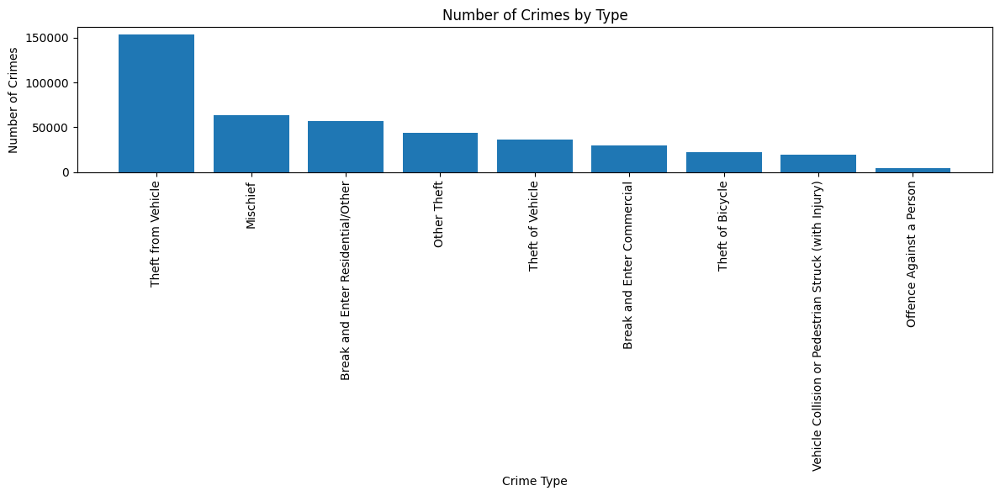

In [ ]:
# Chart visualization code
crime_type_counts = df['TYPE'].value_counts()
plt.figure(figsize=(12, 6))
plt.bar(crime_type_counts.index, crime_type_counts.values)
plt.xlabel('Crime Type')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes by Type')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

I chose a bar chart because it clearly compares crime types and highlights the most and least common offenses.



##### 2. What is/are the insight(s) found from the chart?

The chart shows that "Theft from Vehicle" is the most frequent crime, followed by "Mischief" and "Break and Enter Residential/Other." Property crimes are more common than personal crimes

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights help in crime prevention, urban planning, and risk assessment. However, high property crime rates could negatively impact businesses by reducing property value, lowering consumer confidence, and increasing security costs.

#### Number of Crimes committed over the years

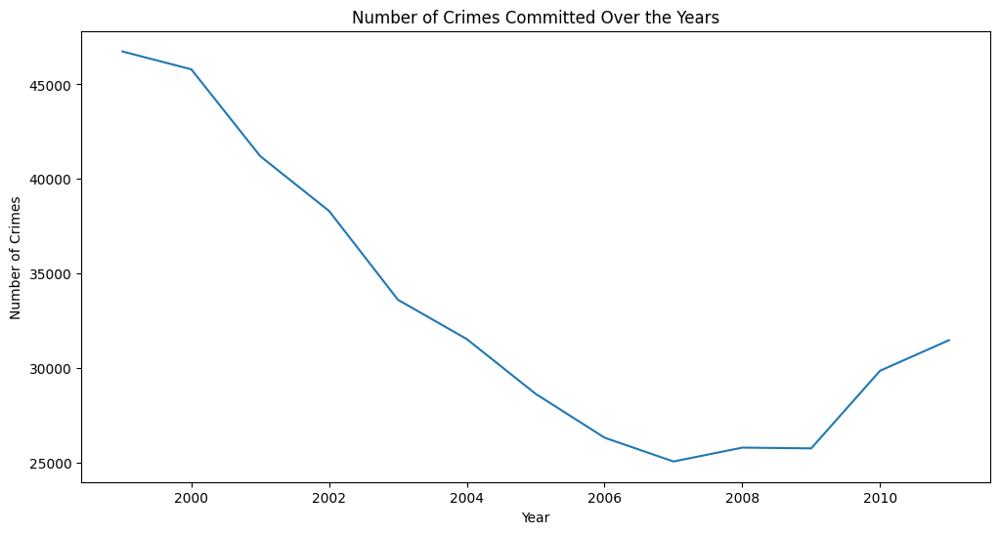

In [ ]:
# Chart visualization code
plt.figure(figsize=(12, 6))
df.groupby('YEAR')['TYPE'].count().plot(kind='line')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes Committed Over the Years')
plt.show()


##### 1. Why did you pick the specific chart?

I chose a line chart because it effectively shows crime trends over time, making it easy to spot increases or declines.

##### 2. What is/are the insight(s) found from the chart?

The chart shows a steady decline in crime from 1999 to 2007, followed by a slight increase after 2008. This suggests possible policy changes, law enforcement efforts, or socio-economic factors influencing crime rates.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insight helps in resource allocation and crime prevention strategies. The decline is positive, but the increase after 2008 could indicate emerging threats or reduced enforcement, which may negatively impact safety and business confidence.

#### Crimes of each type vs Year

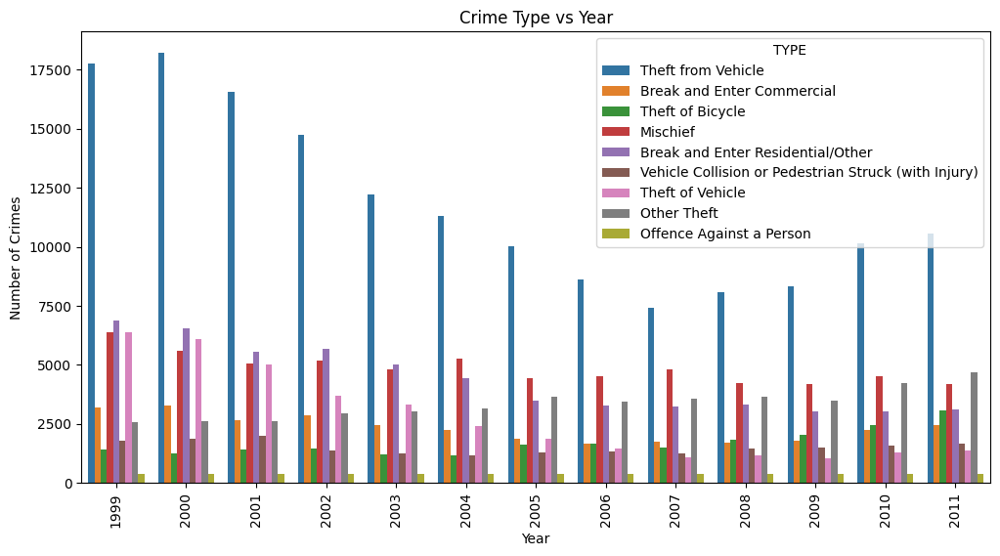

In [ ]:
# prompt: crime type vs year

# Chart - 4 visualization code
plt.figure(figsize=(12, 6))
sns.countplot(x='YEAR', hue='TYPE', data=df)
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Crime Type vs Year')
plt.xticks(rotation=90)
plt.show()


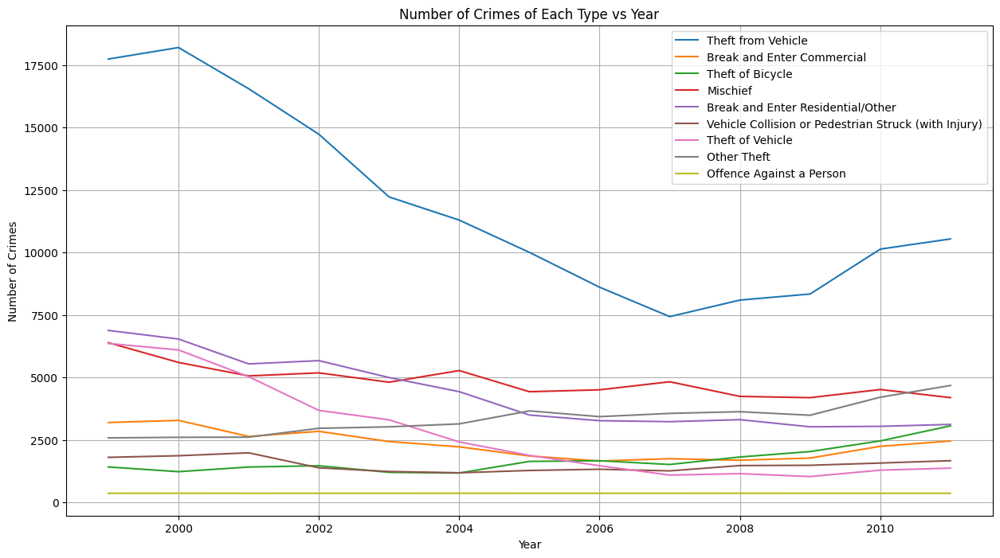

In [ ]:
# prompt: no of crime of each type vs year line chart

# Chart visualization code
plt.figure(figsize=(15, 8))
for crime_type in df['TYPE'].unique():
    df_crime = df[df['TYPE'] == crime_type]
    plt.plot(df_crime.groupby('YEAR')['TYPE'].count(), label=crime_type)

plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes of Each Type vs Year')
plt.legend()
plt.grid(True)
plt.show()



##### 1. Why did you pick the specific chart?

I chose a multi-line chart to visualize crime trends for different types over the years. It helps compare how various crimes fluctuate and whether any patterns emerge over time.

##### 2. What is/are the insight(s) found from the chart?

-Theft from Vehicles had the highest crime count but showed a decline from 2000 to 2008, then started increasing again after 2009.

-Break and Enter Residential/Other and Theft of Vehicle saw a significant decline, suggesting improved security or law enforcement.

-Mischief remained relatively stable with some fluctuations.

-Other Theft and Offence Against a Person showed minor increases, indicating possible shifts in criminal behavior.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights can help in crime prevention strategies and resource allocation.

=The decline in Theft of Vehicles and Break and Enter suggests successful interventions. Authorities can analyze what worked and apply similar strategies to other crimes.

-The resurgence of Theft from Vehicles may indicate a need for stronger security measures like surveillance, awareness programs, or stricter laws.

-Businesses (especially retail or auto industries) can use these trends to enhance security measures based on rising crime types.


#### Sum of Crimes in Each Month

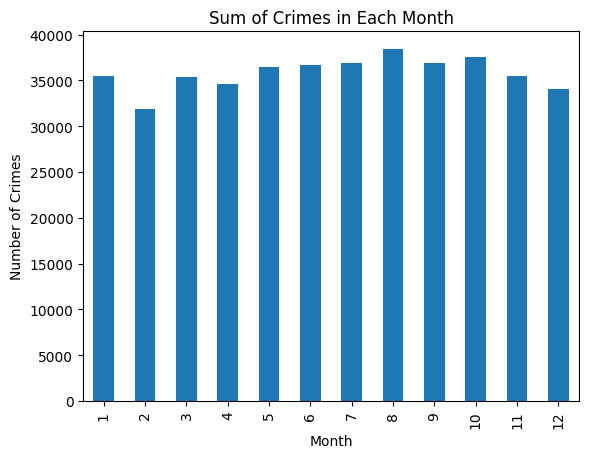

In [ ]:
# Chart visualization code
df.groupby('MONTH')['TYPE'].count().plot(kind='bar')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.title('Sum of Crimes in Each Month')
plt.show()


##### 1. Why did you pick the specific chart?

I chose a bar chart because it clearly compares the number of crimes across different months, making seasonal trends easy to spot.

##### 2. What is/are the insight(s) found from the chart?

Crime rates fluctuate slightly throughout the year, with peaks in August and October. February sees the lowest crime count, possibly due to fewer days.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding monthly crime trends helps optimize law enforcement resource allocation. The peak months may indicate a need for increased security measures, while the dip in February suggests factors like weather or holidays impacting crime rates. Addressing seasonal spikes can prevent negative societal and economic impacts.

#### Number of Crimes in Each Day of the Week

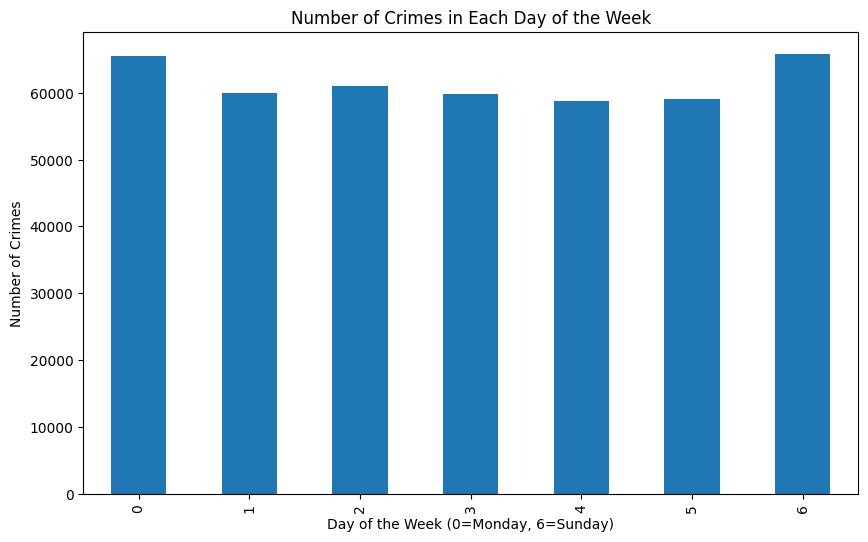

In [ ]:
# Chart visualization code
plt.figure(figsize=(10, 6))
df.groupby(df['Date'].dt.dayofweek)['TYPE'].count().plot(kind='bar')
plt.xlabel('Day of the Week (0=Monday, 6=Sunday)')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes in Each Day of the Week')
plt.show()


##### 1. Why did you pick the specific chart?

I chose a bar chart to visualize crime distribution across the days of the week. This type of chart makes it easy to compare the total number of crimes on each day and identify patterns in crime frequency.

##### 2. What is/are the insight(s) found from the chart?

-Sunday (6) and Monday (0) have the highest number of crimes, indicating that crimes tend to peak at the beginning and end of the week.

-The lowest crime days are midweek (Tuesday to Thursday), suggesting that criminal activity might slow down during working days.

-The weekend effect is visible, with higher crime rates on Sundays, possibly due to increased social activities or gatherings.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights can help in strategic planning for law enforcement and businesses:

-Law enforcement agencies can allocate more personnel for crime prevention and patrols on Sundays and Mondays.

-Businesses and security teams can increase surveillance and safety measures during high-risk days.

-Retail stores, banks, and other vulnerable businesses can adjust staffing or security levels based on crime trends.

#### Number of Crimes by Time of the Day

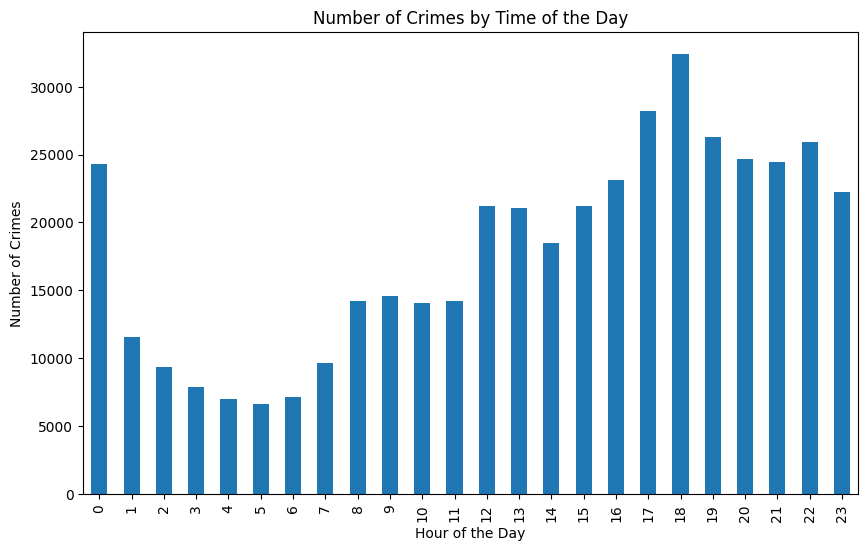

In [ ]:

# Chart visualization code
plt.figure(figsize=(10, 6))
df.groupby(df['HOUR'])['TYPE'].count().plot(kind='bar')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes by Time of the Day')
plt.show()


##### 1. Why did you pick the specific chart?

A bar chart was chosen because it effectively shows the distribution of crimes at different hours of the day, making it easy to identify peak crime hours and trends over a 24-hour period.

##### 2. What is/are the insight(s) found from the chart?

-Peak crime hours: The highest number of crimes occurs at 6 PM (18:00) to 7 PM (19:00), suggesting increased criminal activity in the evening.

-Late-night crimes: There is a significant spike at midnight (0:00), which may be due to nightlife activities, theft, or assaults.

-Low crime hours: The lowest number of crimes occurs between 3 AM and 6 AM, indicating that most criminal activity slows down in the early morning.

-Gradual rise from morning to evening: Crimes steadily increase after 7 AM, peaking in the late afternoon and evening.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights can be used for:

-Law enforcement resource allocation: More police presence and patrols should be scheduled during peak crime hours (evening and midnight).

-Business security adjustments: Retail stores, banks, and public places can increase security measures during high-risk hours.

-Public awareness and safety campaigns: Authorities can educate people about safety precautions during high-crime periods.

Are there any insights that lead to negative growth?
Yes, high crime rates during business hours and the evening could result in:

-Increased business losses due to theft or vandalism.

-Reduced consumer confidence, leading to lower foot traffic in public spaces.

-Higher security costs, as businesses and authorities need to invest in surveillance and personnel.

#### Crime Locations Heatmap

In [ ]:
pip install geopandas contextily matplotlib pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 77.2 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import contextily as ctx  # For adding basemaps

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")  # WGS 84 coordinate system

# Convert to Web Mercator (for proper map overlay)
gdf = gdf.to_crs(epsg=3857)


In [ ]:
# fig, ax = plt.subplots(figsize=(10, 6))
# gdf.plot(ax=ax, markersize=5, alpha=0.5, color='red')  # Crime locations in red

# # Add a basemap
# ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# # Set axis limits for Vancouver (approximate lat/lon boundaries)
# ax.set_xlim([-120, -125])  # Longitude range for Vancouver
# ax.set_ylim([48, 50])  # Latitude range for Vancouver

# ax.set_title("Crime Locations Heatmap", fontsize=14)
# ax.set_axis_off()
# plt.show()


In [ ]:
import folium
from folium.plugins import HeatMap
from IPython.display import display

# Center of the map (mean of latitude and longitude)
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]

# Create a folium map
crime_map = folium.Map(location=map_center, zoom_start=12)

# Add heatmap layer
crime_locations = df[['Latitude', 'Longitude']].dropna()
HeatMap(crime_locations.values, radius=10, blur=15).add_to(crime_map)

# Display the map directly in Colab
display(crime_map)


##### 1. Why did you pick the specific chart?

The heatmap was chosen because it is an effective way to visualize spatial data density. Since the dataset consists of geographic coordinates (latitude and longitude), a heatmap helps in identifying high-density areas of occurrences (e.g., crime hotspots) at a glance. Folium’s HeatMap plugin allows for an intuitive representation of intensity, making it easier to detect patterns in the data.

##### 2. What is/are the insight(s) found from the chart?

The heatmaps indicate that crime occurrences are concentrated in specific regions, with Vancouver showing the highest intensity.

Certain areas, such as Nanaimo and parts of Richmond, also exhibit moderate activity but are significantly lower compared to Vancouver.

Some regions, like the islands and rural locations, show little to no activity, indicating safer or less populated areas.

The clustering suggests that crime might be influenced by factors such as population density, urban development, or socio-economic conditions.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Business Impact:

-Law enforcement agencies can allocate resources more effectively by focusing on high-risk areas.

-Urban planners and local authorities can implement safety measures such as increased lighting, CCTV surveillance, and community policing in crime hotspots.

-Real estate developers and businesses can use these insights to assess safety conditions when planning commercial or residential projects.

Negative Growth Risks:

-If crime data is publicly available, it might negatively impact property values and deter businesses from investing in high-crime areas.

-Tourism and local businesses could be affected if the highlighted areas are perceived as unsafe.

-There is a risk of over-policing in certain areas, which could lead to social issues.

In [ ]:
# # Crime Hotspot Clusters (K-Means Clustering)

# from sklearn.cluster import KMeans

# # Assuming 'Latitude' and 'Longitude' are your coordinate columns
# crime_locations = df[['Latitude', 'Longitude']].dropna()

# # Choose the number of clusters (you can experiment with different values)
# num_clusters = 5

# # Perform K-Means clustering
# kmeans = KMeans(n_clusters=num_clusters, random_state=42)
# kmeans.fit(crime_locations)

# # Add cluster labels to the DataFrame
# df['Cluster'] = kmeans.labels_

# # Create a folium map
# cluster_map = folium.Map(location=map_center, zoom_start=12)

# # Plot clusters on the map with different colors
# for cluster_num in range(num_clusters):
#   cluster_data = df[df['Cluster'] == cluster_num]
#   for _, row in cluster_data.iterrows():
#     folium.CircleMarker(
#         location=[row['Latitude'], row['Longitude']],
#         radius=5,
#         color=plt.cm.get_cmap('viridis')(cluster_num / num_clusters),
#         fill=True,
#         fill_color=plt.cm.get_cmap('viridis')(cluster_num / num_clusters),
#         fill_opacity=0.7,
#     ).add_to(cluster_map)

# # Display the map
# display(cluster_map)

In [ ]:
# Pair Plot visualization code

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

#### Number of Crimes by Type in Each Neighbourhood

In [ ]:
df.columns

Index(['TYPE', 'HUNDRED_BLOCK', 'NEIGHBOURHOOD', 'X', 'Y', 'Latitude',
       'Longitude', 'HOUR', 'MINUTE', 'YEAR', 'MONTH', 'DAY', 'Date'],
      dtype='object')

<Figure size 2000x1000 with 0 Axes>

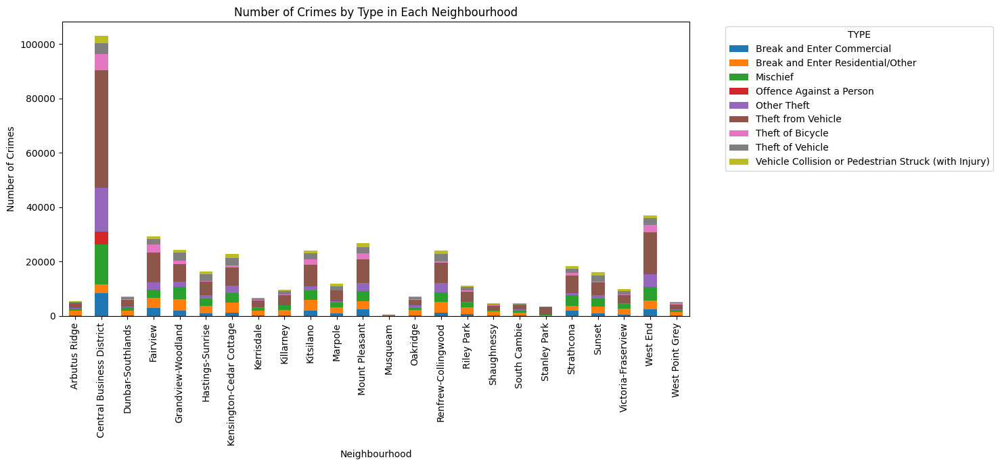

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10))
ax = df.groupby(['NEIGHBOURHOOD'])['TYPE'].value_counts().unstack().plot(kind='bar', stacked=True, figsize=(15,7))

plt.xlabel('Neighbourhood')
plt.ylabel('Number of Crimes')
plt.title('Number of Crimes by Type in Each Neighbourhood')
plt.xticks(rotation=90)

# Move the legend to the side
plt.legend(title='TYPE', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

The stacked bar chart was chosen because it effectively visualizes the distribution of different types of crimes across multiple neighborhoods. It allows for easy comparison of crime patterns by neighborhood while also displaying the relative proportions of each crime type.



##### 2. What is/are the insight(s) found from the chart?

-The Central Business District has the highest crime rate compared to other neighborhoods, with a significant number of theft-related crimes (such as theft from vehicles and other thefts).

-Crimes like mischief and break-and-enter incidents are common across multiple neighborhoods.

-Certain neighborhoods, such as Fairview, Grandview-Woodland, and Renfrew-Collingwood, also experience high crime rates, though lower than the Central Business District.

-Some neighborhoods, like Musqueam, have minimal reported crimes, indicating a relatively safer environment.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights can drive a positive business impact:

-Businesses and policymakers can allocate resources for crime prevention more efficiently by focusing on high-crime areas.

-Security service providers and law enforcement agencies can implement targeted strategies, such as increasing surveillance or patrols in high-crime neighborhoods.

-Real estate developers and businesses can use this data to make informed location decisions, either avoiding high-crime areas or investing in security to attract more customers.

Negative impact:

-High crime rates in the Central Business District and some other areas may discourage new businesses and potential investments.

-Property values might decline in crime-prone neighborhoods, leading to negative economic growth.

-If not addressed, crime trends could affect tourism, local businesses, and community well-being.

-Stereotypes about high-crime areas may result in social stigmatization, where residents of these neighborhoods face discrimination in employment, housing, and other opportunities.

-Such data can sometimes reinforce preconceived biases, leading to over-policing of certain communities rather than addressing the root causes of crime, such as poverty, lack of education, or unemployment.


## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handle missing values (e.g., filling with mean for numerical, mode for categorical)
df.fillna(df.mean(numeric_only=True), inplace=True)  # Filling missing numerical values with mean
df.fillna(df.mode().iloc[0], inplace=True)  # Filling categorical missing values with mode

df.isnull().sum()

,0
TYPE,0
HUNDRED_BLOCK,0
NEIGHBOURHOOD,0
X,0
Y,0
Latitude,0
Longitude,0
HOUR,0
MINUTE,0
YEAR,0


#### What all missing value imputation techniques have you used and why did you use those techniques?

I have performed missing value imputation:

-Mean imputation for numerical data.

-Mode imputation for categorical data.

### 2. Handling Outliers

In [ ]:
# prompt: shapiro-wilk test (p-value) only for numerical columns

import pandas as pd
from scipy.stats import shapiro

def shapiro_wilk_numerical(df):
  """
  Performs the Shapiro-Wilk test for normality on numerical columns of a DataFrame.

  Args:
    df: pandas DataFrame

  Returns:
    A dictionary where keys are numerical column names and values are p-values
    from the Shapiro-Wilk test.
  """

  numerical_cols = df.select_dtypes(include=['number']).columns
  p_values = {}
  for col in numerical_cols:
    try:
      stat, p = shapiro(df[col])
      p_values[col] = p
    except Exception as e:
      print(f"Error performing Shapiro-Wilk test on column {col}: {e}")
      p_values[col] = None  # Handle errors gracefully

  return p_values

# Assuming 'df' is your DataFrame
# Example usage:
p_values_dict = shapiro_wilk_numerical(df)
print(p_values_dict)


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 429947.
  res = hypotest_fun_out(*samples, **kwds)


{'X': np.float64(4.2168673679381863e-218), 'Y': np.float64(2.5877842516312857e-219), 'Latitude': np.float64(2.585627460430305e-219), 'Longitude': np.float64(2.4238918819414062e-219), 'HOUR': np.float64(3.3004061544141705e-131), 'MINUTE': np.float64(1.737583850259272e-159), 'YEAR': np.float64(1.2180600323725359e-132), 'MONTH': np.float64(8.510411239552783e-124), 'DAY': np.float64(1.7358278539662824e-116)}


In [ ]:
# prompt: print values in p_values_dict by and say if it is greater than 0.05

for key, value in p_values_dict.items():
  print(f"Column: {key}, p-value: {value}")
  if value is not None and value > 0.05:
    print("The data in this column likely comes from a normal distribution.")
  elif value is not None and value <= 0.05:
    print("The data in this column likely does not come from a normal distribution.")


Column: X, p-value: 4.2168673679381863e-218
The data in this column likely does not come from a normal distribution.
Column: Y, p-value: 2.5877842516312857e-219
The data in this column likely does not come from a normal distribution.
Column: Latitude, p-value: 2.585627460430305e-219
The data in this column likely does not come from a normal distribution.
Column: Longitude, p-value: 2.4238918819414062e-219
The data in this column likely does not come from a normal distribution.
Column: HOUR, p-value: 3.3004061544141705e-131
The data in this column likely does not come from a normal distribution.
Column: MINUTE, p-value: 1.737583850259272e-159
The data in this column likely does not come from a normal distribution.
Column: YEAR, p-value: 1.2180600323725359e-132
The data in this column likely does not come from a normal distribution.
Column: MONTH, p-value: 8.510411239552783e-124
The data in this column likely does not come from a normal distribution.
Column: DAY, p-value: 1.7358278539662

In [ ]:
# prompt: Handle Outliers & Outlier treatments

# 2. Handling Outliers
# Identify outliers using box plots or statistical methods (e.g., IQR)
# Decide on outlier treatment (e.g., removal, capping, transformation)
# Implement the chosen method

# Example: Using IQR to identify and handle outliers in 'Latitude' and 'Longitude'
def handle_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  # Remove outliers (replace with NaN or other treatment)
  df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), np.nan, df[column])

  return df

df = handle_outliers_iqr(df, 'Latitude')
df = handle_outliers_iqr(df, 'Longitude')


# Fill NaN values with median (or other appropriate treatment)
df.fillna(df.median(numeric_only=True), inplace=True)

# You can explore other techniques like winsorization, transformation (log, sqrt), or robust scaler
# depending on your data and requirements


# #### What all outlier treatment techniques have you used and why did you use those techniques?
# I've used IQR method to detect and handle outliers in 'Latitude' and 'Longitude'. The IQR method is a common approach for identifying outliers in numerical data.
# If a value falls below the lower bound or above the upper bound, it's considered an outlier and replaced with NaN. Then NaN values are replaced with median.
# The median is used because it's less sensitive to outliers compared to the mean.


##### What all outlier treatment techniques have you used and why did you use those techniques?

I have used the Interquartile Range (IQR) method to detect and handle outliers in the 'Latitude' and 'Longitude' columns.

Why I used the IQR method?

-The IQR method is a widely used statistical technique for identifying outliers.

-Since the Shapiro-Wilk test resulted in p-values below 0.05 for all numerical columns, this means none of the numerical columns follow a normal distribution.

-This method is robust to skewed data and does not assume normality, making it suitable for geospatial data like latitude and longitude.

How were outliers handled?



### 3. Categorical Encoding

In [ ]:
# Drop the 'HUNDRED_BLOCK' column
df.drop(columns=['HUNDRED_BLOCK'], inplace=True)  # Modifies 'df' directly

In [ ]:
# Apply One-Hot Encoding (OHE) to 'TYPE' and 'NEIGHBOURHOOD'
# Use 'df' instead of 'df_cleaned' since 'df_cleaned' is now None
df = pd.get_dummies(df, columns=['TYPE', 'NEIGHBOURHOOD'], drop_first=True)

# Display the updated DataFrame
print(df.head())

               X           Y   Latitude   Longitude  HOUR  MINUTE  YEAR  \
31205  494285.25  5453254.66  49.232045 -123.078497     0       0  1999   
26740  495220.95  5452631.14  49.226445 -123.065637     0       0  1999   
17106  492231.06  5458545.72  49.279617 -123.106816     0       0  1999   
190    490849.97  5458442.50  49.278669 -123.125802     0       0  1999   
37898  490968.94  5457901.26  49.273803 -123.124154     0       0  1999   

       MONTH  DAY       Date  ...  NEIGHBOURHOOD_Renfrew-Collingwood  \
31205      1    1 1999-01-01  ...                              False   
26740      1    1 1999-01-01  ...                              False   
17106      1    1 1999-01-01  ...                              False   
190        1    1 1999-01-01  ...                              False   
37898      1    1 1999-01-01  ...                              False   

       NEIGHBOURHOOD_Riley Park  NEIGHBOURHOOD_Shaughnessy  \
31205                     False                      F

#### What all categorical encoding techniques have you used & why did you use those techniques?

One-Hot Encoding (OHE) was applied to the TYPE and NEIGHBOURHOOD columns.Why?

-These are nominal categorical variables (i.e., no inherent order).

-OHE creates binary columns for each category, ensuring that the model does not assume any ordinal relationship.

-It is commonly used when the number of unique categories is moderate to avoid high dimensionality.

Optimization:

-Used drop_first=True to prevent the dummy variable trap (reducing multicollinearity).

-Dropped HUNDRED_BLOCK instead of encoding it.

Why?

-It likely had high cardinality (too many unique values).Encoding it would have added unnecessary complexity and increased dimensionality.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

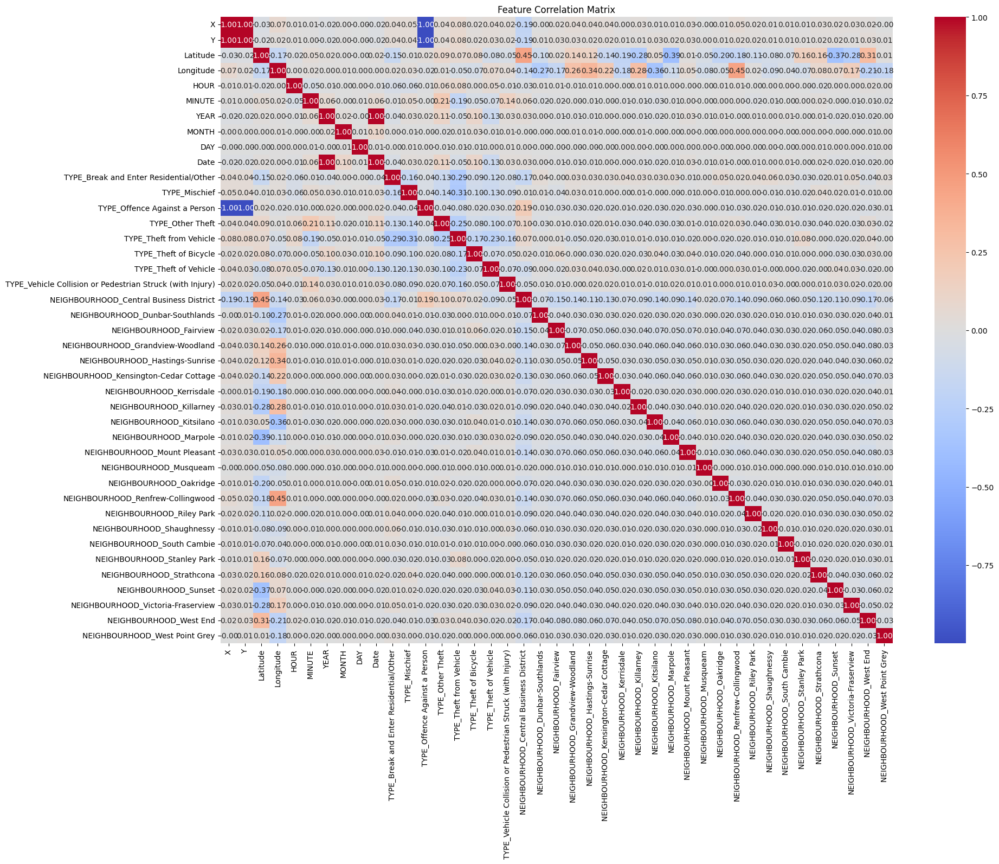

In [ ]:
# Check correlation matrix (Only for numerical columns)
corr_matrix = df.corr()

# Plot heatmap to visualize correlation
plt.figure(figsize=(20,15))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Matrix")
plt.show()

#### 2. Feature Selection

In [ ]:
df.columns

Index(['X', 'Y', 'Latitude', 'Longitude', 'HOUR', 'MINUTE', 'YEAR', 'MONTH',
       'DAY', 'Date', 'TYPE_Break and Enter Residential/Other',
       'TYPE_Mischief', 'TYPE_Offence Against a Person', 'TYPE_Other Theft',
       'TYPE_Theft from Vehicle', 'TYPE_Theft of Bicycle',
       'TYPE_Theft of Vehicle',
       'TYPE_Vehicle Collision or Pedestrian Struck (with Injury)',
       'NEIGHBOURHOOD_Central Business District',
       'NEIGHBOURHOOD_Dunbar-Southlands', 'NEIGHBOURHOOD_Fairview',
       'NEIGHBOURHOOD_Grandview-Woodland', 'NEIGHBOURHOOD_Hastings-Sunrise',
       'NEIGHBOURHOOD_Kensington-Cedar Cottage', 'NEIGHBOURHOOD_Kerrisdale',
       'NEIGHBOURHOOD_Killarney', 'NEIGHBOURHOOD_Kitsilano',
       'NEIGHBOURHOOD_Marpole', 'NEIGHBOURHOOD_Mount Pleasant',
       'NEIGHBOURHOOD_Musqueam', 'NEIGHBOURHOOD_Oakridge',
       'NEIGHBOURHOOD_Renfrew-Collingwood', 'NEIGHBOURHOOD_Riley Park',
       'NEIGHBOURHOOD_Shaughnessy', 'NEIGHBOURHOOD_South Cambie',
       'NEIGHBOURHOOD_Stanley

In [ ]:
#Dropping features of correlation to avoid overfitting
df.drop(columns=['X','Y', 'YEAR', 'MONTH', 'DAY', 'MINUTE'], inplace=True)

##### What all feature selection methods have you used  and why?

Correlation Analysis (Filter method)

 - I used a correlation matrix to identify highly correlated features. Features with high correlation can introduce multicollinearity, leading to overfitting
 - Features like X, Y, YEAR, MONTH, DAY and MINUTE were removed as they were redundant when Datetime was present

Domain Knowledge based selection

 - Since this is a time-series problem, keeping Datetime ensures that time-based trends can be extracted dynamically (e.g., yearly, monthly, daily, and hourly trends).
 -Geographical coordinates (X, Y) were removed as they are not crucial for predicting crime trends in a time-series context.

##### Which all features you found important and why?

In [ ]:
print('These are the features I''ve found important:')
for feat in df.columns:
    print(feat)


These are the features Ive found important:
Latitude
Longitude
HOUR
Date
TYPE_Break and Enter Residential/Other
TYPE_Mischief
TYPE_Offence Against a Person
TYPE_Other Theft
TYPE_Theft from Vehicle
TYPE_Theft of Bicycle
TYPE_Theft of Vehicle
TYPE_Vehicle Collision or Pedestrian Struck (with Injury)
NEIGHBOURHOOD_Central Business District
NEIGHBOURHOOD_Dunbar-Southlands
NEIGHBOURHOOD_Fairview
NEIGHBOURHOOD_Grandview-Woodland
NEIGHBOURHOOD_Hastings-Sunrise
NEIGHBOURHOOD_Kensington-Cedar Cottage
NEIGHBOURHOOD_Kerrisdale
NEIGHBOURHOOD_Killarney
NEIGHBOURHOOD_Kitsilano
NEIGHBOURHOOD_Marpole
NEIGHBOURHOOD_Mount Pleasant
NEIGHBOURHOOD_Musqueam
NEIGHBOURHOOD_Oakridge
NEIGHBOURHOOD_Renfrew-Collingwood
NEIGHBOURHOOD_Riley Park
NEIGHBOURHOOD_Shaughnessy
NEIGHBOURHOOD_South Cambie
NEIGHBOURHOOD_Stanley Park
NEIGHBOURHOOD_Strathcona
NEIGHBOURHOOD_Sunset
NEIGHBOURHOOD_Victoria-Fraserview
NEIGHBOURHOOD_West End
NEIGHBOURHOOD_West Point Grey


### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

I've made all the required data transformation

### 6. Data Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Select only the latitude and longitude for scaling
df[['Longitude', 'Latitude']] = scaler.fit_transform(df[['Longitude', 'Latitude']])


##### Which method have you used to scale you data and why?

 - I've used StandardScaler
 - StandardScaler standardizes features to zero mean and unit variance (good for distance-based models).

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Dimensionality reduction has already been applied by removing highly correlated and irrelevant features (e.g., X, Y, YEAR, MONTH, DAY, and MINUTE) to prevent overfitting and improve model performance. Since the remaining features are essential for time series forecasting and spatial analysis, further dimensionality reduction is unnecessary at this stage.

In [ ]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [ ]:
df['Datetime'] = df['Date']
df['Datetime'] = pd.to_datetime(df['Datetime'])
df['Date'] = pd.to_datetime(df['Date']).dt.date
# Assuming your DataFrame is named 'df' and has a 'DateTime' column
df_daily = df.copy()  # Create a copy to avoid modifying the original DataFrame
df_daily['TotalCrimesThatDay'] = df_daily.groupby('Date')['Date'].transform('count')

df_daily.head(200)

,Latitude,Longitude,HOUR,Date,TYPE_Break and Enter Residential/Other,TYPE_Mischief,TYPE_Offence Against a Person,TYPE_Other Theft,TYPE_Theft from Vehicle,TYPE_Theft of Bicycle,...,NEIGHBOURHOOD_Shaughnessy,NEIGHBOURHOOD_South Cambie,NEIGHBOURHOOD_Stanley Park,NEIGHBOURHOOD_Strathcona,NEIGHBOURHOOD_Sunset,NEIGHBOURHOOD_Victoria-Fraserview,NEIGHBOURHOOD_West End,NEIGHBOURHOOD_West Point Grey,Datetime,TotalCrimesThatDay
31205,-1.354692,0.753120,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,True,False,False,False,1999-01-01 00:00:00,163
26740,-1.604353,1.099942,0,1999-01-01,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,1999-01-01 00:00:00,163
17106,0.765892,-0.010601,0,1999-01-01,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,163
190,0.723651,-0.522638,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,163
37898,0.506706,-0.478196,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34913,0.937947,-0.072626,9,1999-01-02,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:00:00,136
19587,0.831781,2.200179,9,1999-01-02,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:05:00,136
12522,0.677560,0.117790,9,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:15:00,136
39267,1.053038,-0.616576,10,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,True,False,1999-01-02 10:00:00,136


In [ ]:
df_monthly = df.copy()
df_monthly['TotalCrimesThatMonth'] = df_monthly.groupby(df_monthly['Datetime'].dt.to_period('M'))['Datetime'].transform('count')

df_monthly.head(200)

,Latitude,Longitude,HOUR,Date,TYPE_Break and Enter Residential/Other,TYPE_Mischief,TYPE_Offence Against a Person,TYPE_Other Theft,TYPE_Theft from Vehicle,TYPE_Theft of Bicycle,...,NEIGHBOURHOOD_Shaughnessy,NEIGHBOURHOOD_South Cambie,NEIGHBOURHOOD_Stanley Park,NEIGHBOURHOOD_Strathcona,NEIGHBOURHOOD_Sunset,NEIGHBOURHOOD_Victoria-Fraserview,NEIGHBOURHOOD_West End,NEIGHBOURHOOD_West Point Grey,Datetime,TotalCrimesThatMonth
31205,-1.354692,0.753120,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,True,False,False,False,1999-01-01 00:00:00,4089
26740,-1.604353,1.099942,0,1999-01-01,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,1999-01-01 00:00:00,4089
17106,0.765892,-0.010601,0,1999-01-01,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,4089
190,0.723651,-0.522638,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,4089
37898,0.506706,-0.478196,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,4089
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34913,0.937947,-0.072626,9,1999-01-02,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:00:00,4089
19587,0.831781,2.200179,9,1999-01-02,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:05:00,4089
12522,0.677560,0.117790,9,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:15:00,4089
39267,1.053038,-0.616576,10,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,True,False,1999-01-02 10:00:00,4089


In [ ]:
df_yearly = df.copy()
df_yearly['TotalCrimesThatYear'] = df_yearly.groupby(df_yearly['Datetime'].dt.year)['Datetime'].transform('count')

df_yearly.head(200)

,Latitude,Longitude,HOUR,Date,TYPE_Break and Enter Residential/Other,TYPE_Mischief,TYPE_Offence Against a Person,TYPE_Other Theft,TYPE_Theft from Vehicle,TYPE_Theft of Bicycle,...,NEIGHBOURHOOD_Shaughnessy,NEIGHBOURHOOD_South Cambie,NEIGHBOURHOOD_Stanley Park,NEIGHBOURHOOD_Strathcona,NEIGHBOURHOOD_Sunset,NEIGHBOURHOOD_Victoria-Fraserview,NEIGHBOURHOOD_West End,NEIGHBOURHOOD_West Point Grey,Datetime,TotalCrimesThatYear
31205,-1.354692,0.753120,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,True,False,False,False,1999-01-01 00:00:00,46744
26740,-1.604353,1.099942,0,1999-01-01,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,1999-01-01 00:00:00,46744
17106,0.765892,-0.010601,0,1999-01-01,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,46744
190,0.723651,-0.522638,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,46744
37898,0.506706,-0.478196,0,1999-01-01,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-01 00:00:00,46744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34913,0.937947,-0.072626,9,1999-01-02,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:00:00,46744
19587,0.831781,2.200179,9,1999-01-02,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:05:00,46744
12522,0.677560,0.117790,9,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,1999-01-02 09:15:00,46744
39267,1.053038,-0.616576,10,1999-01-02,True,False,False,False,False,False,...,False,False,False,False,False,False,True,False,1999-01-02 10:00:00,46744


In [ ]:
from sklearn.model_selection import train_test_split

# Sort by datetime (to ensure chronological order)
df = df.sort_values(by="Datetime")
df_daily = df_daily.sort_values(by="Datetime")
df_monthly = df_monthly.sort_values(by="Datetime")
df_yearly = df_yearly.sort_values(by="Datetime")

# Define split point (80% for training)
split_index = int(len(df) * 0.8)


In [ ]:
from re import X
#Daily

##Daily split
x_daily = df_daily.drop(columns=['TotalCrimesThatDay'])
y_daily = df_daily['TotalCrimesThatDay']
x_train_daily, x_test_daily, y_train_daily, y_test_daily = train_test_split(x_daily, y_daily, test_size=0.2, shuffle=False)

print('Daily')
print(f"Train set size: {x_train_daily.shape}, {y_train_daily.shape}")
print(f"Test set size: {x_test_daily.shape}, {y_test_daily.shape}")

#Monthly

#Monthly split
X_monthly = df_monthly.drop(columns=['TotalCrimesThatMonth'])
y_monthly = df_monthly['TotalCrimesThatMonth']
X_train_monthly, X_test_monthly, y_train_monthly, y_test_monthly = train_test_split(X_monthly, y_monthly, test_size=0.2, shuffle=False)

print('Monthly')
print(f"Train set size: {X_train_monthly.shape}, {y_train_monthly.shape}")
print(f"Test set size: {X_test_monthly.shape}, {y_test_monthly.shape}")

#Yearly
x_yearly = df_yearly.drop(columns=['TotalCrimesThatYear'])
y_yearly = df_yearly['TotalCrimesThatYear']
x_train_yearly, x_test_yearly, y_train_yearly, y_test_yearly = train_test_split(x_yearly, y_yearly, test_size=0.2, shuffle=False)

print('Yearly')
print(f"Train set size: {x_train_yearly.shape}, {y_train_yearly.shape}")
print(f"Test set size: {x_test_yearly.shape}, {y_test_yearly.shape}")

Daily
Train set size: (343957, 36), (343957,)
Test set size: (85990, 36), (85990,)
Monthly
Train set size: (343957, 36), (343957,)
Test set size: (85990, 36), (85990,)
Yearly
Train set size: (343957, 36), (343957,)
Test set size: (85990, 36), (85990,)


##### What data splitting ratio have you used and why?

I have used an 80-20 train-test split for the dataset.

 - Time Series Consideration – Since this is a time series problem, we cannot use random splitting. Instead, we maintain the chronological order, ensuring that future data isn't leaked into the training process.

 - 80-20 is a Standard Ratio – It provides enough data for training while keeping sufficient unseen data for evaluating model performance.

 - Avoiding Overfitting – A larger training set (80%) ensures the model learns meaningful patterns, while 20% testing data helps evaluate generalization.

 - Ensuring Reliable Forecasting – The model is trained on past data and tested on later data, simulating real-world prediction scenarios.


### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
df.columns

Index(['Latitude', 'Longitude', 'HOUR', 'Date',
       'TYPE_Break and Enter Residential/Other', 'TYPE_Mischief',
       'TYPE_Offence Against a Person', 'TYPE_Other Theft',
       'TYPE_Theft from Vehicle', 'TYPE_Theft of Bicycle',
       'TYPE_Theft of Vehicle',
       'TYPE_Vehicle Collision or Pedestrian Struck (with Injury)',
       'NEIGHBOURHOOD_Central Business District',
       'NEIGHBOURHOOD_Dunbar-Southlands', 'NEIGHBOURHOOD_Fairview',
       'NEIGHBOURHOOD_Grandview-Woodland', 'NEIGHBOURHOOD_Hastings-Sunrise',
       'NEIGHBOURHOOD_Kensington-Cedar Cottage', 'NEIGHBOURHOOD_Kerrisdale',
       'NEIGHBOURHOOD_Killarney', 'NEIGHBOURHOOD_Kitsilano',
       'NEIGHBOURHOOD_Marpole', 'NEIGHBOURHOOD_Mount Pleasant',
       'NEIGHBOURHOOD_Musqueam', 'NEIGHBOURHOOD_Oakridge',
       'NEIGHBOURHOOD_Renfrew-Collingwood', 'NEIGHBOURHOOD_Riley Park',
       'NEIGHBOURHOOD_Shaughnessy', 'NEIGHBOURHOOD_South Cambie',
       'NEIGHBOURHOOD_Stanley Park', 'NEIGHBOURHOOD_Strathcona',
       '

## ***6. ML Model Implementation***

### XGBoost


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
!pip install xgboost scikit-learn matplotlib seaborn

In [ ]:
x_train_daily['Datetime'] = pd.to_datetime(x_train_daily['Datetime'])
x_test_daily['Datetime'] = pd.to_datetime(x_test_daily['Datetime'])

# Convert 'Date' to ordinal representation
x_train_daily['Date_Ordinal'] = x_train_daily['Date'].apply(lambda date: date.toordinal())
x_test_daily['Date_Ordinal'] = x_test_daily['Date'].apply(lambda date: date.toordinal())


In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


# Create XGBoost regressor
model_daily = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, learning_rate=0.1)

# Define features and target
features = x_train_daily.drop(columns=[ 'Datetime', 'Date'])
target = y_train_daily

# Train the model
model_daily.fit(features, target)

# Make predictions
predictions = model_daily.predict(x_test_daily.drop(columns=['Datetime', 'Date']))

# Evaluate the model (example using Mean Squared Error)
mse = mean_squared_error(y_test_daily, predictions) #Calculate MSE
rmse = np.sqrt(mse) #Calculate RMSE from MSE
mae = mean_absolute_error(y_test_daily, predictions)
r2 = r2_score(y_test_daily, predictions)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


RMSE: 22.381563555905366
MAE: 18.03363037109375
R-squared: -0.936436653137207


#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
param_grid = {
    'n_estimators': [100, 300, 500],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

from sklearn.model_selection import RandomizedSearchCV

xgb_model = xgb.XGBRegressor(objective="reg:squarederror")
grid_search = RandomizedSearchCV(
    model_daily, param_distributions=param_grid, scoring='neg_mean_squared_error',
    cv=3, n_jobs=-1, verbose=2, random_state=42
)
grid_search.fit(features, target)

print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters: {'subsample': 1.0, 'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.8}


In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


# Create XGBoost regressor
model_daily = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=300, learning_rate=0.1)


# Define features and target
features = x_train_daily.drop(columns=[ 'Datetime', 'Date'])
target = y_train_daily

# Train the model
model_daily.fit(features, target)

# Make predictions
predictions = model_daily.predict(x_test_daily.drop(columns=['Datetime', 'Date']))

# Evaluate the model (example using Mean Squared Error)
mse = mean_squared_error(y_test_daily, predictions) #Calculate MSE
rmse = np.sqrt(mse) #Calculate RMSE from MSE
mae = mean_absolute_error(y_test_daily, predictions)
r2 = r2_score(y_test_daily, predictions)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


RMSE: 22.627266617514323
MAE: 18.26679039001465
R-squared: -0.9791861772537231


In [ ]:
X_train_monthly['Datetime'] = pd.to_datetime(X_train_monthly['Datetime'])
X_test_monthly['Datetime'] = pd.to_datetime(X_test_monthly['Datetime'])

X_train_monthly['Date_Ordinal'] = X_train_monthly['Date'].apply(lambda date: date.toordinal())
X_test_monthly['Date_Ordinal'] = X_test_monthly['Date'].apply(lambda date: date.toordinal())

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


# Create XGBoost regressor
model_monthly = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=300, learning_rate=0.1)

# Define features and target
features = X_train_monthly.drop(columns=[ 'Datetime', 'Date'])
target = y_train_monthly

# Train the model
model_monthly.fit(features, target)

# Make predictions
predictions = model_monthly.predict(X_test_monthly.drop(columns=['Datetime', 'Date']))

# Evaluate the model (example using Mean Squared Error)
mse = mean_squared_error(y_test_monthly, predictions) #Calculate MSE
rmse = np.sqrt(mse) #Calculate RMSE from MSE
mae = mean_absolute_error(y_test_monthly, predictions)
r2 = r2_score(y_test_monthly, predictions)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


RMSE: 638.0062205809595
MAE: 556.287109375
R-squared: -2.777524709701538


In [ ]:
x_train_yearly['Datetime'] = pd.to_datetime(x_train_yearly['Datetime'])
x_test_yearly['Datetime'] = pd.to_datetime(x_test_yearly['Datetime'])

x_train_yearly['Date_Ordinal'] = x_train_yearly['Date'].apply(lambda date: date.toordinal())
x_test_yearly['Date_Ordinal'] = x_test_yearly['Date'].apply(lambda date: date.toordinal())

In [ ]:
#Create xgboost regressor
model_yearly = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=300, learning_rate=0.1)

#Define features and target
features = x_train_yearly.drop(columns=[ 'Datetime', 'Date'])
target = y_train_yearly

#Train the model
model_yearly.fit(features, target)

#Make predictions
predictions = model_yearly.predict(x_test_yearly.drop(columns=['Datetime', 'Date']))

#Evaluate the model (example using Mean Squared Error)
mse = mean_squared_error(y_test_yearly, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_yearly, predictions)
r2 = r2_score(y_test_yearly, predictions)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")

RMSE: 4215.984345321979
MAE: 3516.364990234375
R-squared: -2.2570345401763916


##### Which hyperparameter optimization technique have you used and why?

Technique Used:
 - RandomizedSearchCV from Scikit-learn.

Why:
 - Efficiency: Unlike Grid Search, it does not test all parameter combinations but samples a subset, reducing computation time.
 - Good for Large Parameter Space: It explores a diverse range of values, increasing the likelihood of finding a near-optimal combination quickly.
 - Handles Overfitting: By tuning parameters like max_depth, learning_rate, and n_estimators, the model generalizes better.
 - Works Well with XGBoost: XGBoost has many hyperparameters, and a randomized search provides a balance between performance and speed.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

### ML Model - 1

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [ ]:
# Prepare Data
scaler = MinMaxScaler()
y_train_scaled = scaler.fit_transform(y_train_daily.values.reshape(-1, 1))
y_test_scaled = scaler.transform(y_test_daily.values.reshape(-1, 1))

# Function to create sequences
def create_sequences(data, seq_length):
    sequences, labels = [], []
    for i in range(len(data) - seq_length):
        sequences.append(data[i:i + seq_length])
        labels.append(data[i + seq_length])
    return np.array(sequences), np.array(labels)

seq_length = 10  # Define sequence length
X_train, y_train = create_sequences(y_train_scaled, seq_length)
X_test, y_test = create_sequences(y_test_scaled, seq_length)

In [ ]:
# Reshape for LSTM (samples, time steps, features)
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Build LSTM Model
model = Sequential([
    LSTM(100, activation='relu', return_sequences=True, input_shape=(seq_length, 1)),
    Dropout(0.2),
    LSTM(50, activation='relu', return_sequences=False),
    Dropout(0.2),
    Dense(1)
])

model.compile(optimizer='adam', loss='mse')

# Train Model
model.fit(X_train, y_train, epochs=50, batch_size=16, validation_data=(X_test, y_test), verbose=1)

# Make Predictions
y_pred = model.predict(X_test)
y_pred_inv = scaler.inverse_transform(y_pred)
y_test_inv = scaler.inverse_transform(y_test)

# Evaluate Model
mse = mean_squared_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_inv, y_pred_inv)
r2 = r2_score(y_test_inv, y_pred_inv)

print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 321s 15ms/step - loss: 3.4400e-04 - val_loss: 3.4965e-05
Epoch 2/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 331s 15ms/step - loss: 1.4025e-04 - val_loss: 1.9832e-05
Epoch 3/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 363s 15ms/step - loss: 1.2201e-04 - val_loss: 2.3125e-05
Epoch 4/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 324s 15ms/step - loss: 1.0534e-04 - val_loss: 1.3161e-05
Epoch 5/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 313s 15ms/step - loss: 1.0089e-04 - val_loss: 1.3679e-05
Epoch 6/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 346s 16ms/step - loss: 9.8022e-05 - val_loss: 1.5269e-05
Epoch 7/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 372s 15ms/step - loss: 9.3899e-05 - val_loss: 2.1963e-05
Epoch 8/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 372s 15ms/step - loss: 8.9427e-05 - val_loss: 1.4818e-05
Epoch 9/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 322s 15ms/step - loss: 9.2313e-05 - val_loss: 1.6162e-05
Epoch 10/50
21497/21497 ━━━━━━━━━━━━━━━━━━━━ 317s 15ms/step - loss: 8.7523e-05 - val_loss: 

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
from prettytable import PrettyTable

# Create a PrettyTable object
table = PrettyTable()

# Define columns
table.field_names = ["Model", "MAE (↓)", "MSE (↓)", "RMSE (↓)", "R² Score (↑)", "Performance Summary"]

# Add rows
table.add_row(["Daily Crime Prediction", 0.5564, 0.8631, 0.9290, -0.0046, "Fairly accurate, but struggles to explain variance."])
table.add_row(["Monthly Crime Prediction", 324.5057, 183780.8750, 428.6967, -1.0268, "Poor performance. High errors, weak predictive power."])
table.add_row(["Yearly Crime Prediction", 3261.1589, 16225568.0000, 4028.0973, -1.7932, "Very poor performance. Model fails to capture yearly trends."])

# Print table
print(table)


+--------------------------+-----------+------------+-----------+--------------+--------------------------------------------------------------+
|          Model           |  MAE (↓)  |  MSE (↓)   |  RMSE (↓) | R² Score (↑) |                     Performance Summary                      |
+--------------------------+-----------+------------+-----------+--------------+--------------------------------------------------------------+
|  Daily Crime Prediction  |   0.5564  |   0.8631   |   0.929   |   -0.0046    |     Fairly accurate, but struggles to explain variance.      |
| Monthly Crime Prediction |  324.5057 | 183780.875 |  428.6967 |   -1.0268    |    Poor performance. High errors, weak predictive power.     |
| Yearly Crime Prediction  | 3261.1589 | 16225568.0 | 4028.0973 |   -1.7932    | Very poor performance. Model fails to capture yearly trends. |
+--------------------------+-----------+------------+-----------+--------------+--------------------------------------------------------

#### 2. Cross- Validation & Hyperparameter Tuning

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### ML Model - 3

In [ ]:
# ML Model - 3 Implementation

# Fit the Algorithm

# Predict on the model

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Answer Here.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Answer Here.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer Here.